In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

In [2]:
transforms = transforms.Compose(
[
    transforms.ToTensor(),
])

In [3]:
class Discriminator(nn.Module):
    def __init__(self, img_dim):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Linear(img_dim, 512),
            nn.LeakyReLU(0.1),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.1),
            nn.Linear(256, 128),
            nn.LeakyReLU(0.1),
            nn.Linear(128, 1),
            nn.Sigmoid(),
        )
        
    def forward(self, x):
        return self.disc(x)

In [4]:
class Generator(nn.Module):
    def __init__(self, z_dim, img_dim):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            nn.Linear(z_dim, 512),
            nn.LeakyReLU(0.1),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.1),
            nn.Linear(256, img_dim), #28x28 -> 784
            nn.Sigmoid(),
        )
        
    def forward(self, z_dim):
        return self.gen(z_dim)
    

In [5]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
lr = 3e-4
z_dim = 64
image_dim = 28 * 28 * 1 # 784
batch_size = 32
num_epochs = 100

In [6]:
disc = Discriminator(image_dim).to(device)
gen = Generator(z_dim, image_dim).to(device)

In [7]:
fixed_noise = torch.randn((batch_size, z_dim), device=device)

In [8]:
dataset = datasets.MNIST(root='dataset/', transform=transforms, download=True)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4)
opt_disc = optim.Adam(disc.parameters(), lr=lr)
opt_gen = optim.Adam(gen.parameters(), lr=lr)
criterion = nn.BCELoss()

100%|██████████| 9912422/9912422 [00:00<00:00, 113295195.34it/s]


Extracting dataset/MNIST/raw/train-images-idx3-ubyte.gz to dataset/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 47522830.06it/s]

Extracting dataset/MNIST/raw/train-labels-idx1-ubyte.gz to dataset/MNIST/raw




100%|██████████| 1648877/1648877 [00:00<00:00, 38110804.09it/s]


Extracting dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to dataset/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 7529853.27it/s]


Extracting dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to dataset/MNIST/raw



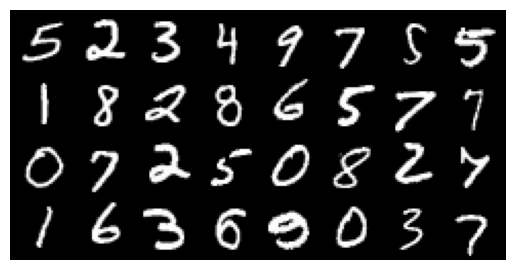

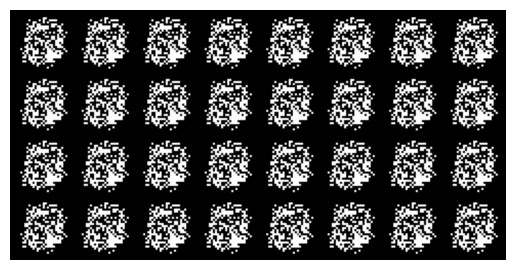

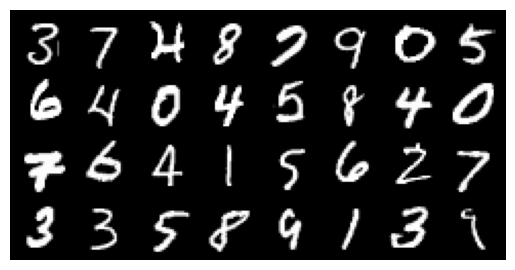

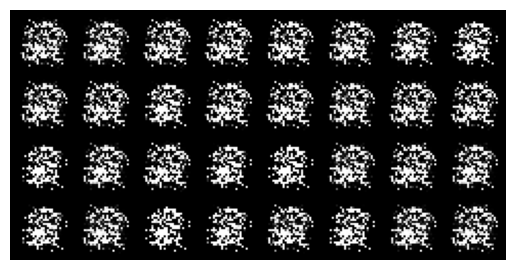

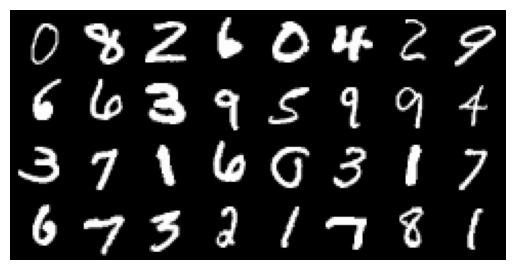

...

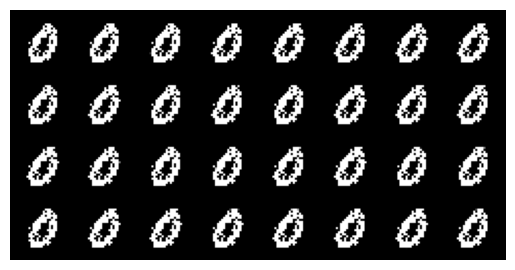

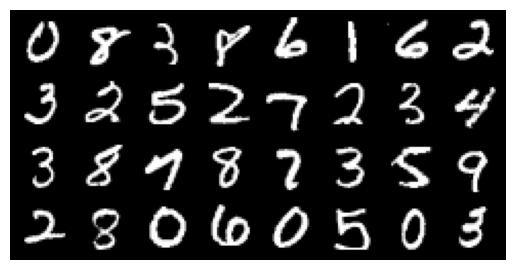

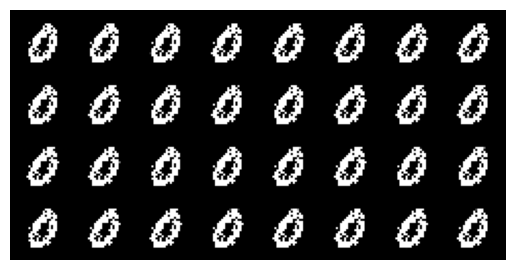

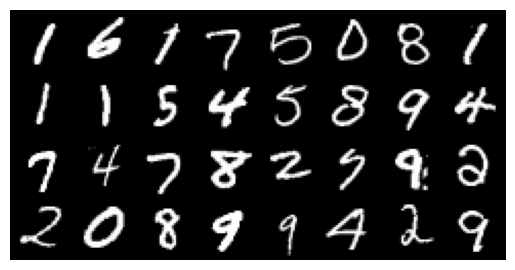

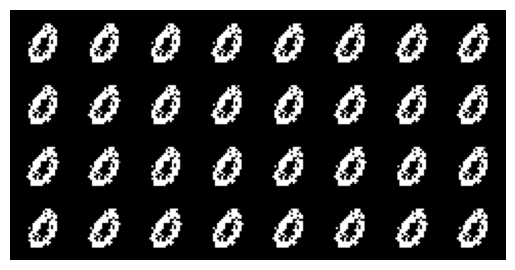

In [9]:
for epoch in range(num_epochs):
    for batch_idx, (real, _) in enumerate(loader):
        real = real.view(-1, 784).to(device)
        batch_size = real.shape[0]
        
        ## Train Discriminator: max log (D(real)) + log(1-D(G(z)))

        noise = torch.randn(batch_size, z_dim, device=device)
        fake = gen(noise)
        disc_real = disc(real).view(-1)
        lossD_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = disc(fake.detach()).view(-1)
        lossD_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        lossD = (lossD_real + lossD_fake)/2
        disc.zero_grad()
        lossD.backward(retain_graph=True)
        opt_disc.step()
        
        ## Tain Generator min log(1 -D(G(z))) <--> max (log (D(G(z))))
        output = disc(fake).view(-1)
        lossG = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        lossG.backward()
        opt_gen.step()
        
    with torch.no_grad():
        fake = gen(fixed_noise).reshape(-1, 1, 28,28)
        img_grid_real = torchvision.utils.make_grid(
        real[:32].reshape(-1,1,28,28), normalize=True)
        img_grid_fake = torchvision.utils.make_grid(
        fake[:32], normalize=True
        )

        img_grid_real = img_grid_real.permute(1, 2, 0).cpu().numpy()
        img_grid_fake = img_grid_fake.permute(1, 2, 0).cpu().numpy()


        plt.imshow(img_grid_real)
        plt.axis('off')
        plt.show()

        plt.imshow(img_grid_fake)
        plt.axis('off')
        plt.show()
